<a href="https://colab.research.google.com/github/YdoUcare-qm/Smart-Waste-Management/blob/main/DLCV_Project_Data_Visualizaton.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
!pip install pillow matplotlib

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os

In [14]:
# Define file paths
csv_path = '/content/drive/MyDrive/Smart Waste Management in Modern Cities/Train-Data.csv'
image_folder_path = '/content/drive/MyDrive/Smart Waste Management in Modern Cities/Image-Files/'

# Load CSV data
data = pd.read_csv(csv_path)

# Display the first few rows
data.head()


,image,query,label,startX,startY,endX,endY
0,398faec8-6799-11e5-8dc4-40f2e96c8ad8.jpg,city garbage,1.0,18.0,113.0,528.0,427.0
1,3adba2c8-6799-11e5-8dc4-40f2e96c8ad8.jpg,city garbage,NaN,NaN,NaN,NaN,NaN
2,46e3e5ee-6799-11e5-8dc4-40f2e96c8ad8.jpg,city garbage,1.0,188.0,183.0,553.0,401.0
3,47e1b9a8-6799-11e5-8dc4-40f2e96c8ad8.jpg,city garbage,NaN,NaN,NaN,NaN,NaN
4,495f1dca-6799-11e5-8dc4-40f2e96c8ad8.jpg,city garbage,1.0,270.0,306.0,369.0,340.0


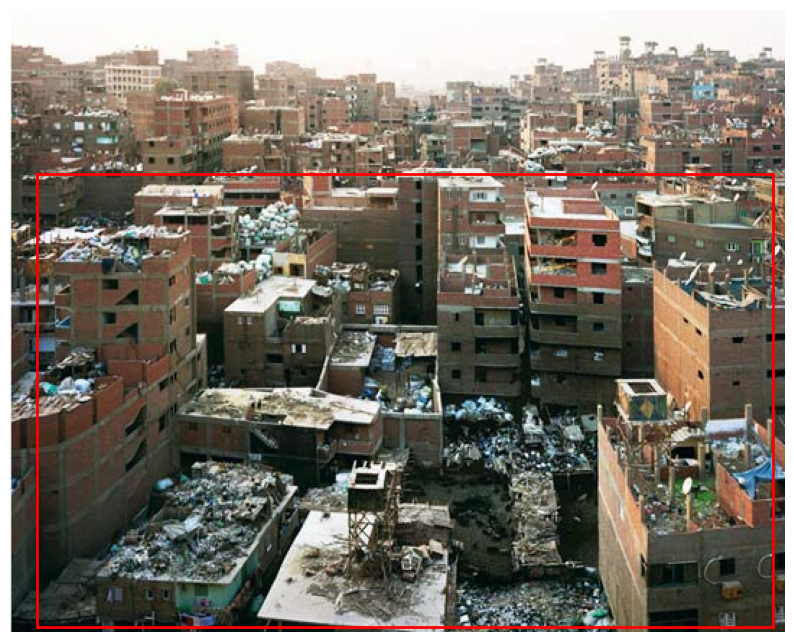

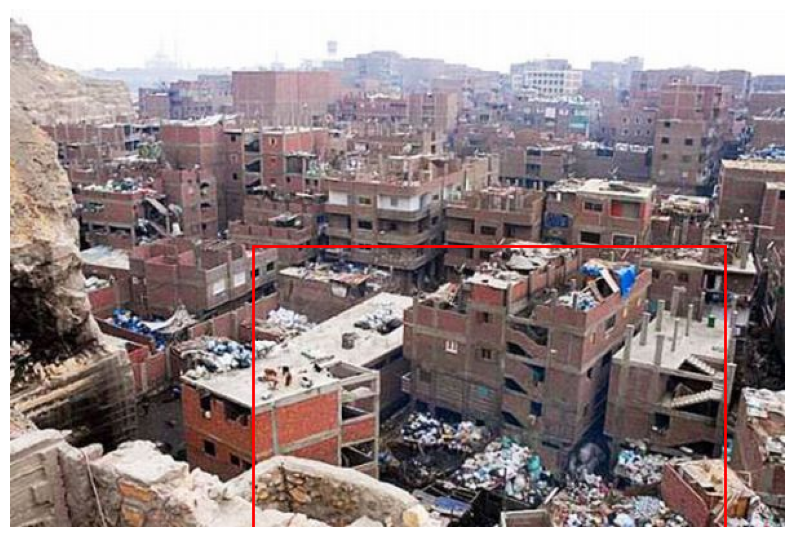

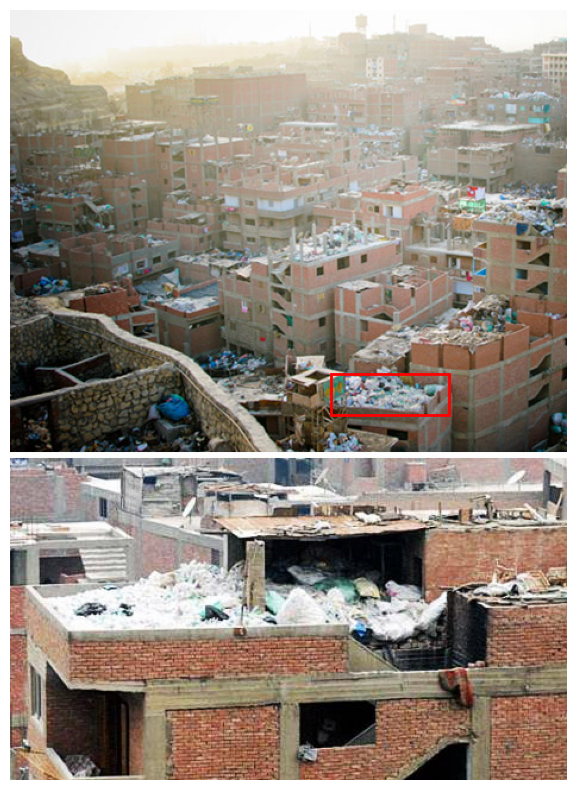

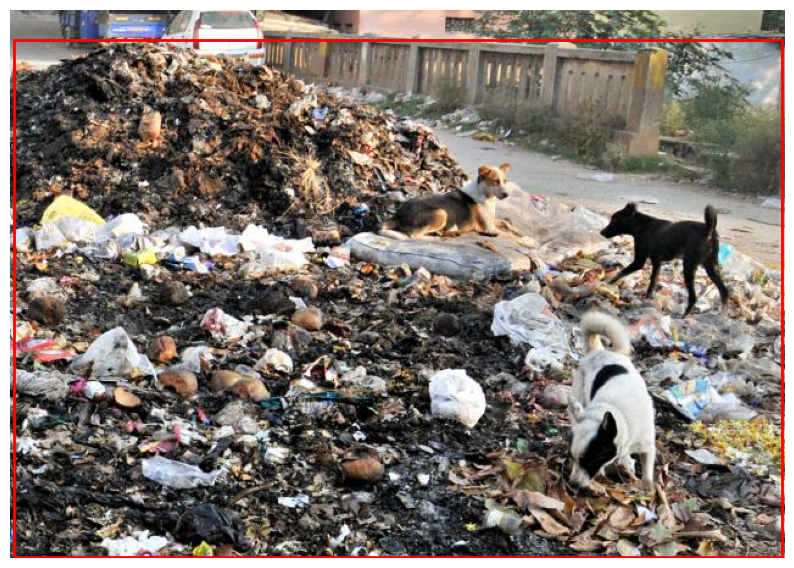

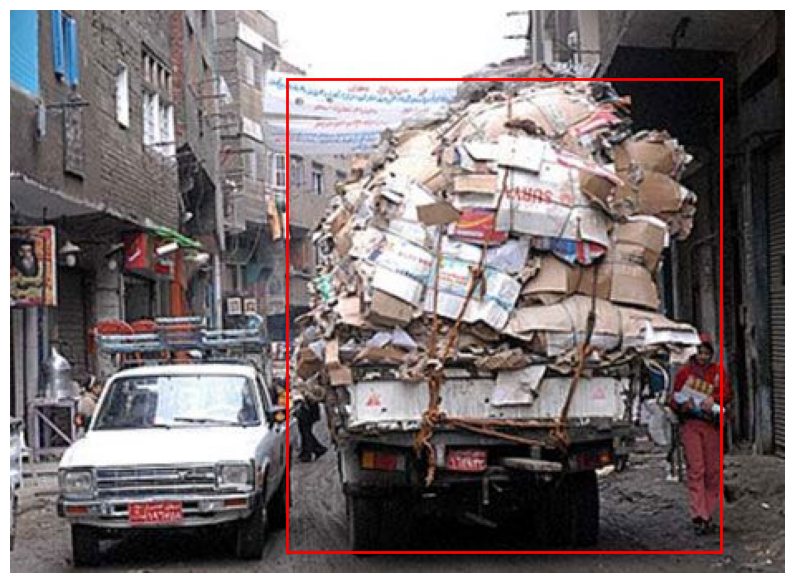

...

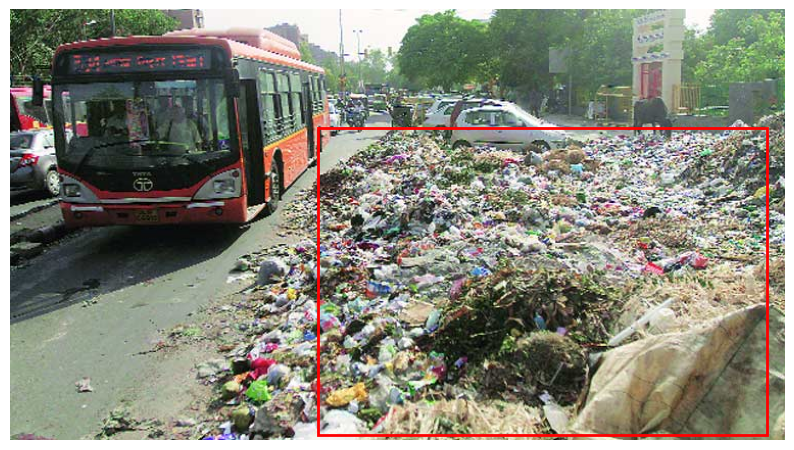

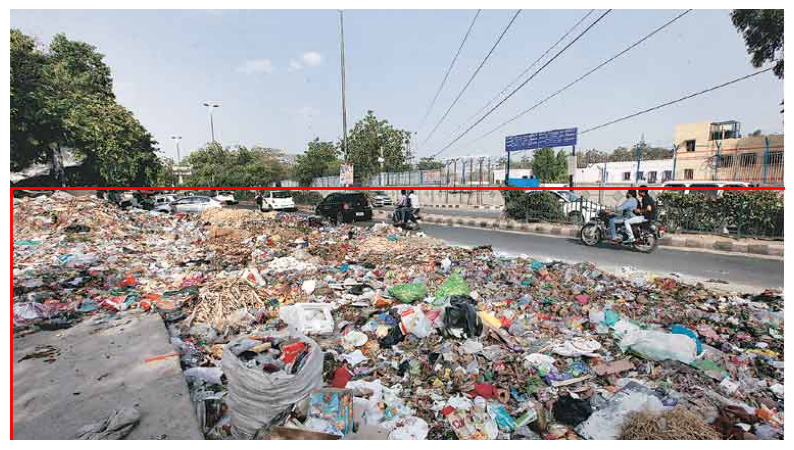

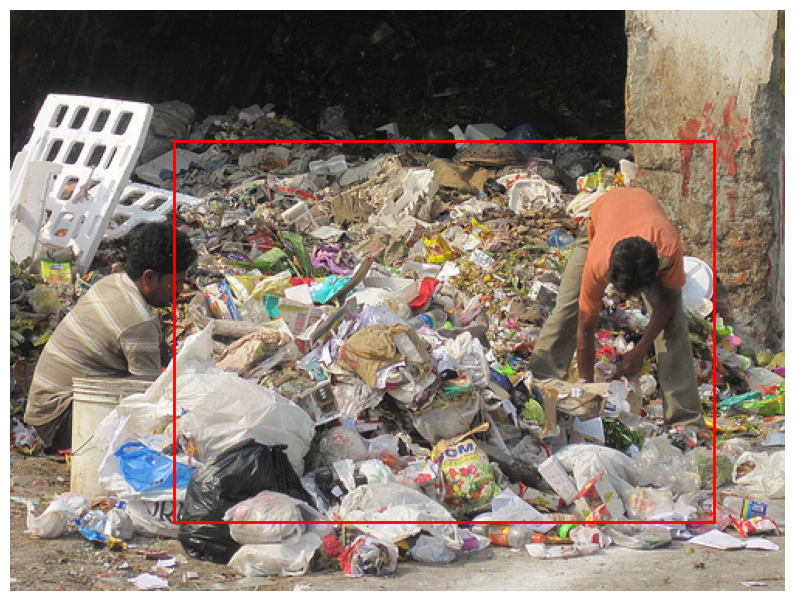

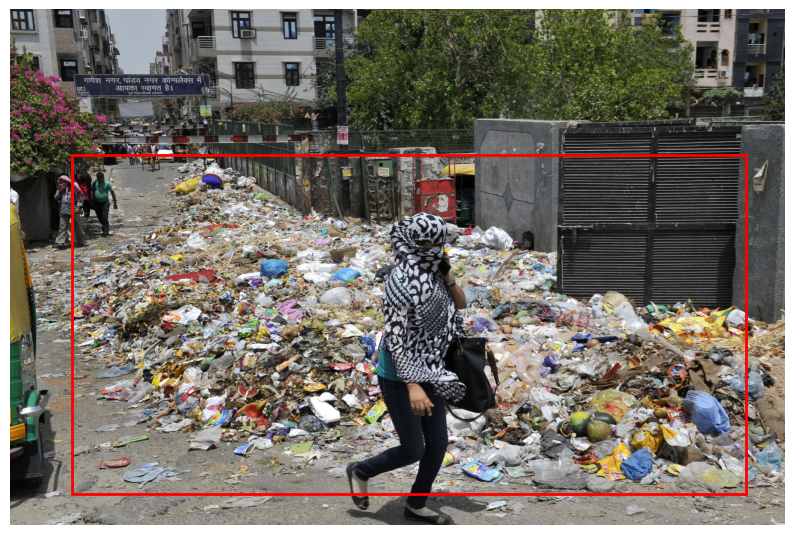

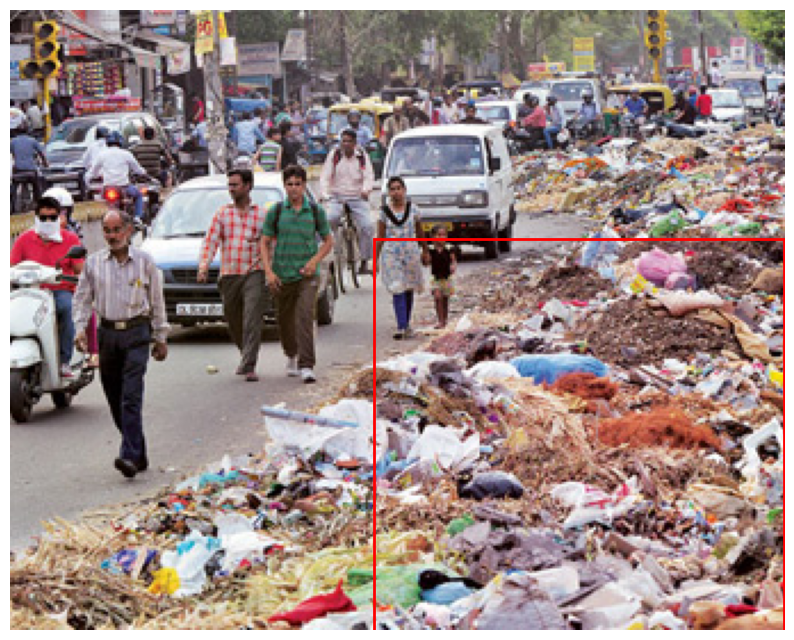

In [15]:
def visualize_image_with_boxes(image_path, boxes):
    # Load the image
    image = Image.open(image_path)

    # Convert image to matplotlib format
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Draw bounding boxes
    ax = plt.gca()
    for box in boxes:
        startX, startY, endX, endY = box
        rect = plt.Rectangle((startX, startY), endX - startX, endY - startY, fill=False, color='red', linewidth=2)
        ax.add_patch(rect)

    plt.axis('off')
    plt.show()

# Counter to limit the number of images shown
image_count = 0
max_images = 20

# Iterate through the CSV file and visualize images with bounding boxes
for _, row in data.iterrows():
    image_id = row['image']  # Adjust if your column name is different
    label = row['label']
    query_folder = row['query']  # Get the category folder name from 'Query'

    # Check if image contains waste
    if label == 1:  # Assuming 1 means it contains waste
        # Construct the image path including the subfolder
        image_path = os.path.join(image_folder_path, query_folder, image_id)

        # Extract bounding boxes
        startX = row['startX'] if pd.notna(row['startX']) else 0
        startY = row['startY'] if pd.notna(row['startY']) else 0
        endX = row['endX'] if pd.notna(row['endX']) else 0
        endY = row['endY'] if pd.notna(row['endY']) else 0
        boxes = [(startX, startY, endX, endY)]

        # Visualize the image with bounding boxes
        visualize_image_with_boxes(image_path, boxes)

        # Increment counter
        image_count += 1

        # Break if the maximum number of images is reached
        if image_count >= max_images:
            break
